# Phase 1 Project

# Normal Task___ Exploratory Data Analysis - Terrorism

# Installation of libraries and dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import warnings
warnings.filterwarnings('ignore')
import os
import plotly.graph_objects as go
import plotly.express as px

In [2]:
df = pd.read_csv('Terrorism.csv',encoding='latin')

In [3]:
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [4]:
# NUmber of rows and columns in data set
print("Number of rows:",df.shape[0])
print("Number of columns:",df.shape[1])

Number of rows: 181691
Number of columns: 135


In [5]:
# Data type of each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [6]:
# Statistical analysis
df.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


# Data preperation and Cleaning

In [7]:
# Checking th null values
df.isnull().sum()

eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [8]:
# renaming the columns
df.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country',
                       'region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target',
                       'nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group',
                       'targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
df=df[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType',
               'Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive']]

# concatinating the columns killed and wounded
df["Killed"]=df["Killed"].fillna(0)
df["Wounded"]=df["Wounded"].fillna(0)
df["Casualty"]=df["Killed"]+df["Wounded"]
df.head(5)

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,Casualty
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1.0
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,0.0,0.0,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,0.0
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,0.0,0.0,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,0.0


# Basic Analysis by using visulisation

Which country has highest terrorirst attacks?

In [9]:
colors = ['lightslategray',] * 11
colors[0] = 'crimson'
x=df['Country'].value_counts().index
y=df['Country'].value_counts()
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors,text=y,
            textposition='auto'  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Countries having terrorist attacks', xaxis_title="Countries",
    yaxis_title="Sum of occurences",)

Which region has highest terrorirst attacks?

In [10]:
colors = ['lightslategray',] * 13
colors[11] = 'dodgerblue'
x=df['Region'].value_counts().sort_values().index
y=df['Region'].value_counts().sort_values()
fig = go.Figure(data=[go.Bar(
    x=y.tolist(),
    y=x.tolist(),
    marker_color=colors,text=y,orientation='h',
            textposition='auto'  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Regions having highest terrorist attacks', xaxis_title="Regions",
    yaxis_title="Sum of occurences",)

Which is the most weapon used by terrorirsts ?

In [11]:
df['Weapon_type'] = df['Weapon_type'].replace(['Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)'],'Vehicles')
colors = ['lightslategray',] * 11
colors[0] = 'cyan'
x=df['Weapon_type'].value_counts().index
y=df['Weapon_type'].value_counts()
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors,text=y,
            textposition='auto'  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Weapons used by terrorists', xaxis_title="Weapons",
    yaxis_title="Sum of occurences",)

Motive behind activities related to terrorism

In [12]:
df1 = df[df['Motive'].notna()]

In [13]:
df1['Motive']

5            To protest the Cairo Illinois Police Deparment
8               To protest the War in Vietnam and the draft
9               To protest the War in Vietnam and the draft
11                        Protest the draft and Vietnam War
14        To protest United States owned businesses in P...
                                ...                        
181663    The specific motive is unknown; however, sourc...
181665    The specific motive is unknown; however, sourc...
181672    The specific motive is unknown; however, sourc...
181682    The specific motive is unknown; however, sourc...
181683    The specific motive is unknown; however, sourc...
Name: Motive, Length: 50561, dtype: object

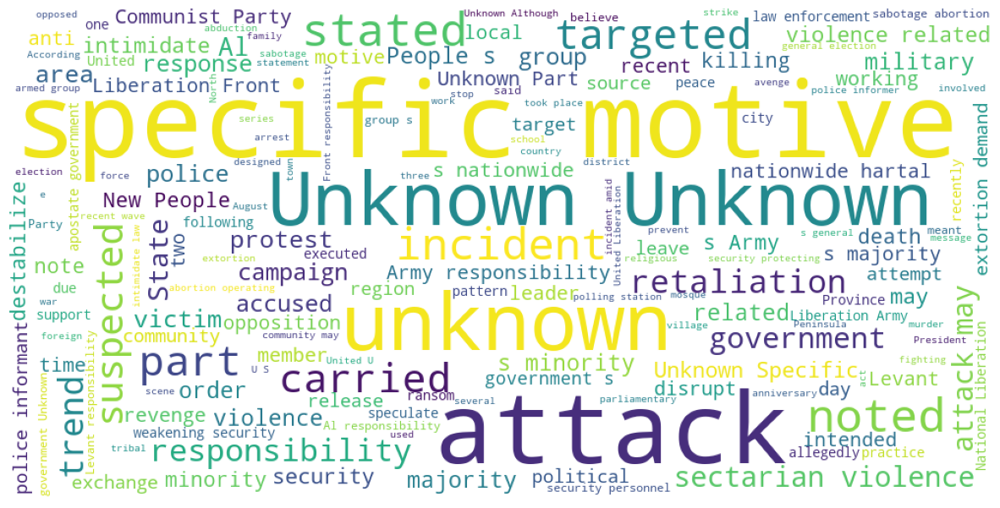

In [14]:
# Removing irrelevant words in clean_t column
import nltk
words = set(nltk.corpus.words.words())

def clean_sent(sent):
    return " ".join(w for w in nltk.wordpunct_tokenize(sent) \
     if w.lower() in words or not w.isalpha())

df1['Motive'] = df1['Motive'].apply(clean_sent)
south_df = df_new = df1[df1['Motive'].notnull()].reset_index()

ingredients = []
for i in range(0,len(south_df)):
    text = south_df['Motive'][i].split(',')
    text = ','.join(text)
    ingredients.append(text)
    text = ' '.join(ingredients)
    
wordcloud = WordCloud(width = 1000, height = 500,background_color ='white',min_font_size = 10).generate(text)                  
plt.figure(figsize = (15, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.show()

Number of terrorist activities occured in region with respect to year

In [15]:
fig_bar = px.histogram(df, x="Region", y="Killed",
                 animation_frame="Year",
                 color_discrete_sequence=px.colors.qualitative.T10)
fig_bar.update_yaxes(showgrid=False),
fig_bar.update_xaxes(categoryorder='total descending')
fig_bar.update_traces(hovertemplate=None)
fig_bar.update_layout(margin=dict(t=70, b=0, l=70, r=40),
                        hovermode="x unified",
                        xaxis_tickangle=45,
                        xaxis_title=' ', yaxis_title=" ",
                        plot_bgcolor='#2d3035', paper_bgcolor='#2d3045',
                        title_font=dict(size=25, color='#a6a7ab', family="Lato, sans-serif"),
                        font=dict(color='#8a8d93'),
                        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                          )
fig_bar.show()

Number of Terrorist activities vs Year

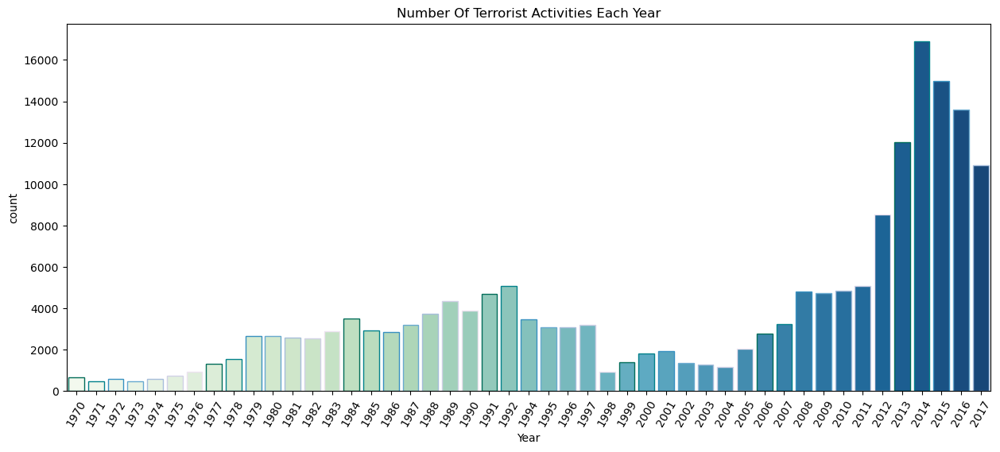

In [16]:
plt.subplots(figsize=(15,6))
sns.countplot(x='Year',data=df,palette='GnBu',edgecolor=sns.color_palette('PuBuGn_r',7))
plt.xticks(rotation=60)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

In [17]:
df['Killed'].sum()

411868.0

Who are the main targets?

In [18]:
colors = ['lightslategray',] * 22
colors[0] = 'cyan'
x=df['Target_type'].value_counts().index
y=df['Target_type'].value_counts()
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Main Targets', xaxis_title="Targets",
    yaxis_title="Sum of occurences",)

Hot zones of terrorism (by Country)

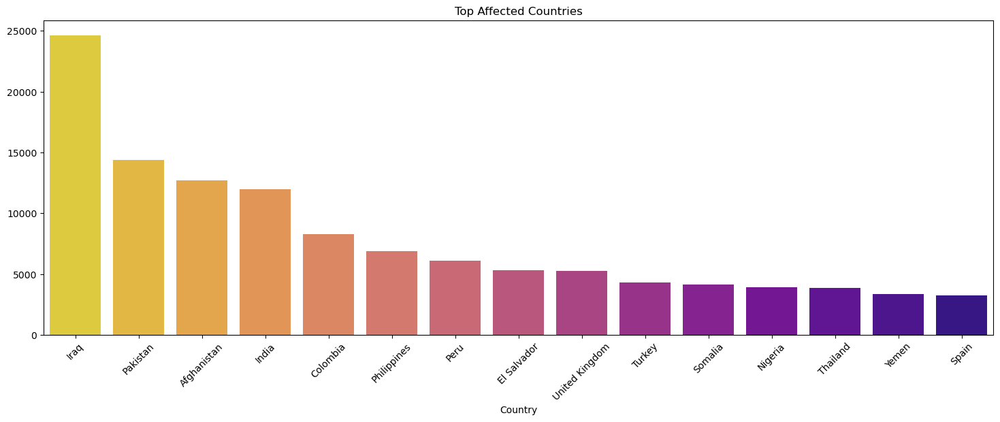

In [19]:
plt.subplots(figsize=(18, 6))
top_countries = df['Country'].value_counts()[:15]
sns.barplot(x=top_countries.index, y=top_countries.values, palette='plasma_r')
plt.title('Top Affected Countries')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

Hot zones of terrorism (by City)

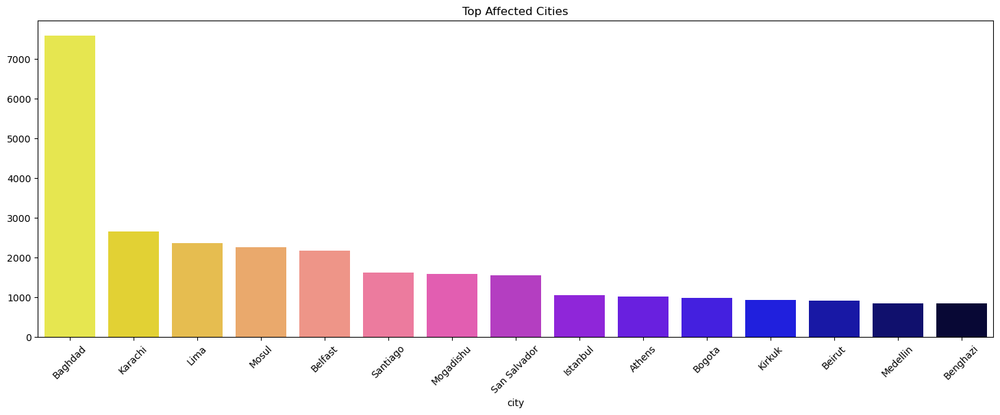

In [20]:
plt.subplots(figsize=(18, 6))
top_cities = df['city'].value_counts()[1:16]  # Select the top 15 cities
sns.barplot(x=top_cities.index, y=top_cities.values, palette='gnuplot2_r')
plt.title('Top Affected Cities')
plt.xticks(rotation=45)
plt.show()

What are the attacking methods used?

In [21]:
colors = ['lightslategray',] * 22
colors[0] = 'darkblue'
x=df['AttackType'].value_counts().index
y=df['AttackType'].value_counts()
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Main Targets', xaxis_title="Targets",
    yaxis_title="Sum of occurences",)

Attacks vs Killed

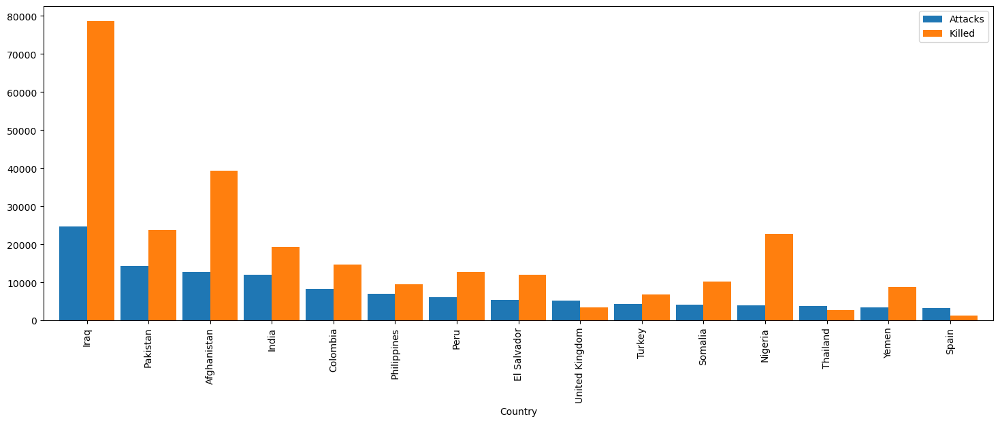

In [22]:
coun_terror=df['Country'].value_counts()[:15].to_frame()
coun_terror.columns=['Attacks']
coun_kill=df.groupby('Country')['Killed'].sum().to_frame()
coun_terror.merge(coun_kill,left_index=True,right_index=True,how='left').plot.bar(width=0.9)
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.show()

Most Notorious Groups

In [23]:
colors = ['lightslategray',] * 22
colors[13] = 'darkblue'
x=df['Group'].value_counts()[1:15].sort_values().values
y=df['Group'].value_counts()[1:15].sort_values().index
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors,orientation='h'  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Main Targets', xaxis_title="Targets",
    yaxis_title="Sum of occurences",)

Activity of Top Terrorist Groups

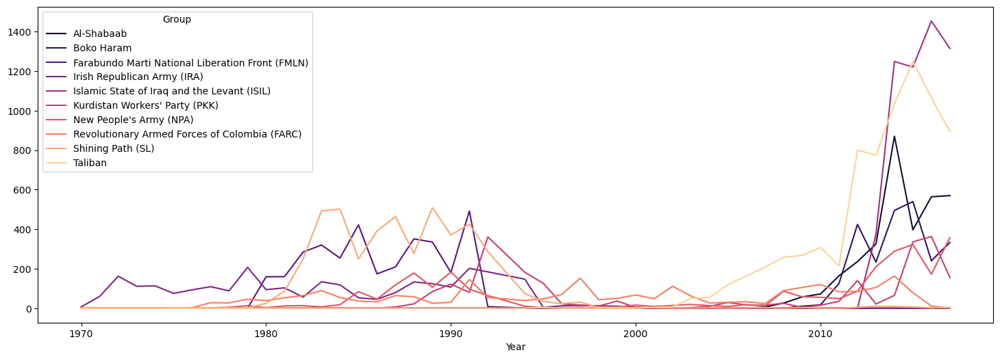

In [24]:
top_groups10=df[df['Group'].isin(df['Group'].value_counts()[1:11].index)]
pd.crosstab(top_groups10.Year,top_groups10.Group).plot(color=sns.color_palette('magma',10))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.show()

Humanity Affected (World-wide) by Terrorist Attacks from 1970 to 2017

In [25]:
gk=df.groupby(by=["Year"], dropna=False,as_index=False).sum()
colors = ['lightslategray',] * 55
colors[43] = 'darkblue'
x=gk['Year']
y=gk['Casualty']
fig = go.Figure(data=[go.Bar(
    x=x.tolist(),
    y=y.tolist(),
    marker_color=colors  # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text='Humanity Affected (World-wide) by Terrorist Attacks from 1970 to 2017', xaxis_title="Year",
    yaxis_title="Sum of occurences",)

In [26]:
casualty=df.loc[:,"Casualty"].sum()
print("Total number of Casualties due to Terrorist Attacks from 1970 to 2017 across the world :\n",casualty)

Total number of Casualties due to Terrorist Attacks from 1970 to 2017 across the world :
 935737.0
